# Locale.ai Interview- Data Science Task

### Importing the libraries

In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import cm
import seaborn as sns
sns.set(style = "white", palette = "muted", color_codes = True)
import pandas as pd
import numpy as np
from math import *

import folium
from folium import plugins
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap


### Data Description
1. **id** - booking ID
2. **user_id** - the ID of the customer (based on mobile number)
3. **vehicle_model_id** - vehicle model type.
4. **package_id** - type of package (1=4hrs & 40kms, 2=8hrs & 80kms, 3=6hrs & 60kms, 4= 10hrs & 100kms, 5=5hrs & 50kms, 6=3hrs & 30kms, 7=12hrs & 120kms)
5. **travel_type_id** - type of travel (1=long distance, 2= point to point, 3= hourly rental).
6. **from_area_id** - unique identifier of area. Applicable only for point-to-point travel and packages
7. **to_area_id** - unique identifier of area. Applicable only for point-to-point travel
8. **from_city_id** - unique identifier of city
9. **to_city_id** - unique identifier of city (only for intercity)
10. **from_date** - time stamp of requested trip start
11. **to_date** - time stamp of trip end
12. **online_booking** - if booking was done on desktop website
13. **mobile_site_booking** - if booking was done on mobile website
14. **booking_created** - time stamp of booking
15. **from_lat** - latitude of from area
16. **from_long** - longitude of from area
17. **to_lat** - latitude of to area
18. **to_long** - longitude of to area
19. **Car_Cancellation** - whether the booking was cancelled (1) or not (0) due to unavailability of a car.

### Importing the Dataset

In [2]:
df = pd.read_csv('./Data.csv')
df.head()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,to_date,online_booking,mobile_site_booking,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,1/1/2013 2:00,NaN,0,0,1/1/2013 1:39,12.924150,77.672290,12.927320,77.635750,0
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,1/1/2013 9:00,NaN,0,0,1/1/2013 2:25,12.966910,77.749350,12.927680,77.626640,0
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,1/1/2013 3:30,NaN,0,0,1/1/2013 3:08,12.937222,77.626915,13.047926,77.597766,0
3,132515,13034,12,NaN,2,768.0,398.0,NaN,NaN,1/1/2013 5:45,NaN,0,0,1/1/2013 4:39,12.989990,77.553320,12.971430,77.639140,0
4,132517,22180,12,NaN,2,1365.0,849.0,NaN,NaN,1/1/2013 9:00,NaN,0,0,1/1/2013 7:53,12.845653,77.677925,12.954340,77.600720,0


### The info method prints the concise summary of a DataFrame like total entries, column names and their Dtypes, Non-Null counts, and memory usage.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43431 entries, 0 to 43430
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id                   43431 non-null  int64  
 1   user_id              43431 non-null  int64  
 2   vehicle_model_id     43431 non-null  int64  
 3   package_id           7550 non-null   float64
 4   travel_type_id       43431 non-null  int64  
 5   from_area_id         43343 non-null  float64
 6   to_area_id           34293 non-null  float64
 7   from_city_id         16345 non-null  float64
 8   to_city_id           1588 non-null   float64
 9   from_date            43431 non-null  object 
 10  to_date              25541 non-null  object 
 11  online_booking       43431 non-null  int64  
 12  mobile_site_booking  43431 non-null  int64  
 13  booking_created      43431 non-null  object 
 14  from_lat             43338 non-null  float64
 15  from_long            43338 non-null 

### The describe method prints the descriptive statistics including those that summarizes the central tendency, dispersion and shape of a dataset’s distribution, but excluding NaN values.

In [4]:
df.describe()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,online_booking,mobile_site_booking,from_lat,from_long,to_lat,to_long,Car_Cancellation
count,43431.000000,43431.000000,43431.00000,7550.000000,43431.000000,43343.000000,34293.000000,16345.000000,1588.000000,43431.000000,43431.000000,43338.000000,43338.000000,34293.000000,34293.000000,43431.000000
mean,159206.473556,30739.198153,25.71723,2.030066,2.137252,714.544494,669.490917,14.915081,68.537783,0.351592,0.043241,12.982461,77.636255,13.026648,77.640595,0.072114
std,15442.386279,10996.476709,26.79825,1.461756,0.437712,419.883553,400.638225,1.165306,49.880732,0.477473,0.203402,0.085933,0.059391,0.113487,0.064045,0.258680
min,132512.000000,16.000000,1.00000,1.000000,1.000000,2.000000,2.000000,1.000000,4.000000,0.000000,0.000000,12.776630,77.386930,12.776630,77.386930,0.000000
25%,145778.000000,24614.000000,12.00000,1.000000,2.000000,393.000000,393.000000,15.000000,32.000000,0.000000,0.000000,12.926450,77.593661,12.951850,77.582030,0.000000
50%,159248.000000,31627.000000,12.00000,2.000000,2.000000,590.000000,541.000000,15.000000,49.000000,0.000000,0.000000,12.968887,77.635750,12.982750,77.645030,0.000000
75%,172578.500000,39167.000000,24.00000,2.000000,2.000000,1089.000000,1054.000000,15.000000,108.000000,1.000000,0.000000,13.007750,77.688900,13.199560,77.706880,0.000000
max,185941.000000,48730.000000,91.00000,7.000000,3.000000,1403.000000,1403.000000,31.000000,203.000000,1.000000,1.000000,13.366072,77.786420,13.366072,77.786420,1.000000


### Let's now find out the null (NaN) values in each column

In [5]:
df.isnull().sum()

id                         0
user_id                    0
vehicle_model_id           0
package_id             35881
travel_type_id             0
from_area_id              88
to_area_id              9138
from_city_id           27086
to_city_id             41843
from_date                  0
to_date                17890
online_booking             0
mobile_site_booking        0
booking_created            0
from_lat                  93
from_long                 93
to_lat                  9138
to_long                 9138
Car_Cancellation           0
dtype: int64

### Let's see those missing values in percentage

In [6]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'percent_missing': percent_missing})
missing_value_df

,percent_missing
id,0.000000
user_id,0.000000
vehicle_model_id,0.000000
package_id,82.616104
travel_type_id,0.000000
from_area_id,0.202620
to_area_id,21.040271
from_city_id,62.365591
to_city_id,96.343626
from_date,0.000000


In [7]:
df.package_id.unique()

array([nan,  2.,  1.,  4.,  3.,  5.,  6.,  7.])

**Note - For package_id 1 = 4hrs & 40kms and 2 = 8hrs & 80kms, the travel_type_id is 3 = hourly rental.**

**And, majority of the values are NULL in the to_area_id column for the above condition.**

In [8]:
list(df.select_dtypes(['object']).columns)

['from_date', 'to_date', 'booking_created']

### Converting from_date, to_date, and booking_created columns into datetime dtype

In [9]:
df['from_date'] = df['from_date'].astype('datetime64[ns]')
df['to_date'] = df['to_date'].astype('datetime64[ns]')
df['booking_created'] = df['booking_created'].astype('datetime64[ns]')

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43431 entries, 0 to 43430
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   id                   43431 non-null  int64         
 1   user_id              43431 non-null  int64         
 2   vehicle_model_id     43431 non-null  int64         
 3   package_id           7550 non-null   float64       
 4   travel_type_id       43431 non-null  int64         
 5   from_area_id         43343 non-null  float64       
 6   to_area_id           34293 non-null  float64       
 7   from_city_id         16345 non-null  float64       
 8   to_city_id           1588 non-null   float64       
 9   from_date            43431 non-null  datetime64[ns]
 10  to_date              25541 non-null  datetime64[ns]
 11  online_booking       43431 non-null  int64         
 12  mobile_site_booking  43431 non-null  int64         
 13  booking_created      43431 non-

In [11]:
df.head(3)

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,to_date,online_booking,mobile_site_booking,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,2013-01-01 02:00:00,NaT,0,0,2013-01-01 01:39:00,12.924150,77.672290,12.927320,77.635750,0
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,2013-01-01 09:00:00,NaT,0,0,2013-01-01 02:25:00,12.966910,77.749350,12.927680,77.626640,0
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,2013-01-01 03:30:00,NaT,0,0,2013-01-01 03:08:00,12.937222,77.626915,13.047926,77.597766,0


## Exploratory Data Analysis (EDA)

### Visualising the frequency of booking created  in a week

In [12]:
from datetime import datetime as dt
df['booking_created_day'] = df.booking_created.dt.dayofweek

In [13]:
df.head(3)

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,to_date,online_booking,mobile_site_booking,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation,booking_created_day
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,2013-01-01 02:00:00,NaT,0,0,2013-01-01 01:39:00,12.924150,77.672290,12.927320,77.635750,0,1
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,2013-01-01 09:00:00,NaT,0,0,2013-01-01 02:25:00,12.966910,77.749350,12.927680,77.626640,0,1
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,2013-01-01 03:30:00,NaT,0,0,2013-01-01 03:08:00,12.937222,77.626915,13.047926,77.597766,0,1


In [14]:
df.booking_created_day.unique()

array([1, 2, 3, 4, 5, 6, 0])

### Let's replace these unique numbers to name of the day in a week

In [15]:
df['booking_created_day'] = df.booking_created_day.replace([0, 1, 2, 3, 4, 5, 6], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

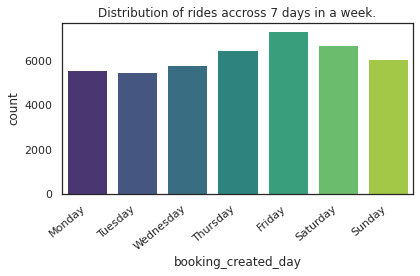

In [16]:
ax = sns.countplot(df['booking_created_day'], order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'], palette='viridis')
plt.title("Distribution of rides accross 7 days in a week.")

ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

**So, the highest average bookings in every week that's being created is on Friday, Saturday and Thursday**

**NOTE - Booking created is different from trip start. Because, the user could cancel the booking due to many reasons like delay in the pickup etc.**

### So let's visualise the frequency of trip start in a week

In [17]:
df['trip_start_day'] = df.from_date.dt.dayofweek

### Let's replace these unique numbers to name of the day in a week

In [18]:
df['trip_start_day'] = df.trip_start_day.replace([0, 1, 2, 3, 4, 5, 6], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

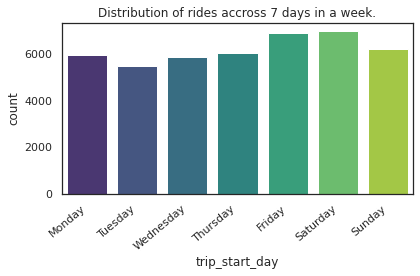

In [19]:
ax = sns.countplot(df['trip_start_day'], order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'], palette='viridis')
plt.title("Distribution of rides accross 7 days in a week.")

ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

**We can notice that the trip start is lower on tuesday compared to all other days.**

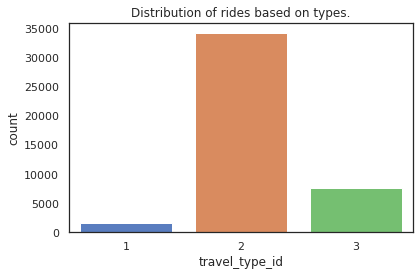

In [20]:
ax = sns.countplot(df['travel_type_id'])
plt.title("Distribution of rides based on types.")

plt.tight_layout()
plt.show()

**From the above count plot, we can see that most of the people travelled from point to point.**

### Below is the count plot to visualize how many bookings were cancelled and not cancelled

[Text(0, 0, 'Not cancelled'), Text(0, 0, 'Cancelled')]

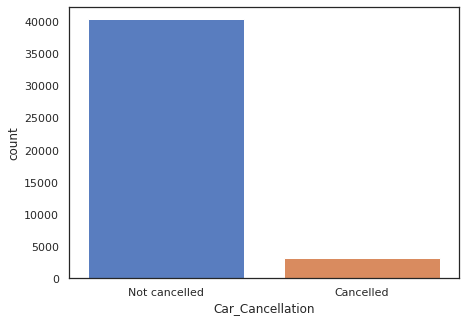

In [21]:
plt.figure(figsize=(7, 5))
cplot = sns.countplot(x='Car_Cancellation',data=df)
cplot.set_xticklabels(('Not cancelled', 'Cancelled'))

**From the below pie chart, we can see that only 7.2 percent of the bookings were cancelled**

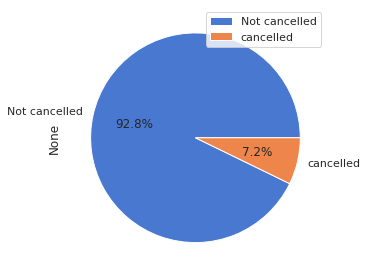

In [22]:
df.groupby(df.Car_Cancellation).size().plot(kind='pie', legend=True, autopct='%1.1f%%', labels = ['Not cancelled', 'cancelled'])
plt.tight_layout()

### Box plot- to visually show the distribution of numerical data and skewness through displaying the data quartiles (or percentiles) and averages.

**NOTE** - Any data point that is located outside the whiskers of the box plot is defined as an outlier. Since this is geo spatial analysis, let's not worry about the outliers because users can book the cab fron any location (any lat-long).

**Let's see the average latitudes and longitudes that users are booking to travel from one place to another (starting location and the destination location) in 7 days of week.** 

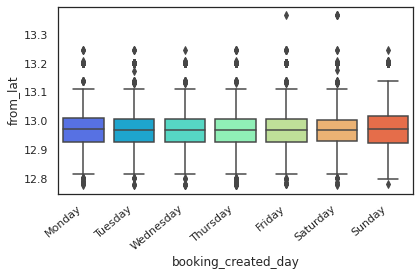

In [23]:
ax = sns.boxplot(x="booking_created_day", y="from_lat", data=df,palette='rainbow', order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

**From the above box plot, it can be seen that the interquartile range of departing latitude is between 12.93 and 13.1**

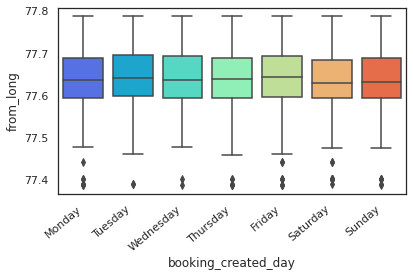

In [24]:
ax = sns.boxplot(x="booking_created_day", y="from_long", data=df,palette='rainbow', order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

**From the above box plot, it can be seen that the interquartile range of departing longitude is between 77.6 and 77.69**

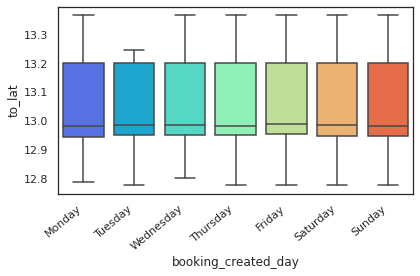

In [25]:
ax = sns.boxplot(x="booking_created_day", y="to_lat", data=df,palette='rainbow',order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

**From the above box plot, it can be seen that the interquartile range of destination latitude is between 12.95 and 13.2**

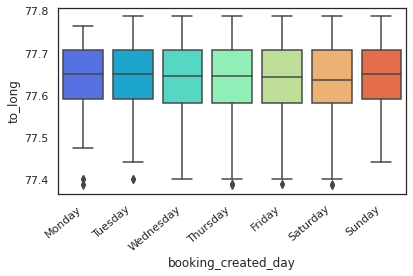

In [26]:
ax = sns.boxplot(x="booking_created_day", y="to_long", data=df,palette='rainbow',order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

**From the above box plot, it can be seen that the interquartile range of destination longitude is between 77.6 and 77.71**

### Let's now compute and visualize the pairwise correlation of columns, excluding NaN / null values.

In [27]:
df.corr()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,online_booking,mobile_site_booking,from_lat,from_long,to_lat,to_long,Car_Cancellation
id,1.000000,0.595899,0.056554,0.433360,0.005581,0.023031,0.026940,0.225908,-0.028117,0.106483,0.088570,0.045256,0.031744,0.031378,0.033955,0.134326
user_id,0.595899,1.000000,0.061292,0.240933,-0.037577,0.018645,0.008703,0.065497,-0.035831,0.096956,0.054116,0.052895,0.006649,0.052065,0.033748,0.102789
vehicle_model_id,0.056554,0.061292,1.000000,0.045967,-0.034539,-0.023267,-0.037043,-0.042479,0.001020,0.015371,-0.006961,0.057314,0.022373,0.058760,0.049285,-0.045244
package_id,0.433360,0.240933,0.045967,1.000000,NaN,-0.006633,NaN,NaN,NaN,-0.022390,-0.029405,-0.032442,0.026772,NaN,NaN,0.071583
travel_type_id,0.005581,-0.037577,-0.034539,NaN,1.000000,0.024930,-0.005533,0.207693,NaN,-0.069832,-0.022955,-0.095385,-0.023688,0.003299,-0.000338,-0.023360
from_area_id,0.023031,0.018645,-0.023267,-0.006633,0.024930,1.000000,0.007327,0.020152,0.013729,0.015911,-0.010490,-0.110597,-0.095218,0.007955,0.007227,0.011357
to_area_id,0.026940,0.008703,-0.037043,NaN,-0.005533,0.007327,1.000000,NaN,NaN,0.004139,-0.014738,0.042631,0.024901,-0.267853,-0.274238,0.066088
from_city_id,0.225908,0.065497,-0.042479,NaN,0.207693,0.020152,NaN,1.000000,0.000166,-0.088069,0.013358,-0.030439,-0.017189,NaN,NaN,0.024755
to_city_id,-0.028117,-0.035831,0.001020,NaN,NaN,0.013729,NaN,0.000166,1.000000,-0.031759,0.050449,-0.040576,-0.006810,NaN,NaN,-0.007882
online_booking,0.106483,0.096956,0.015371,-0.022390,-0.069832,0.015911,0.004139,-0.088069,-0.031759,1.000000,-0.156546,0.043011,0.070559,0.062623,0.016946,0.149476


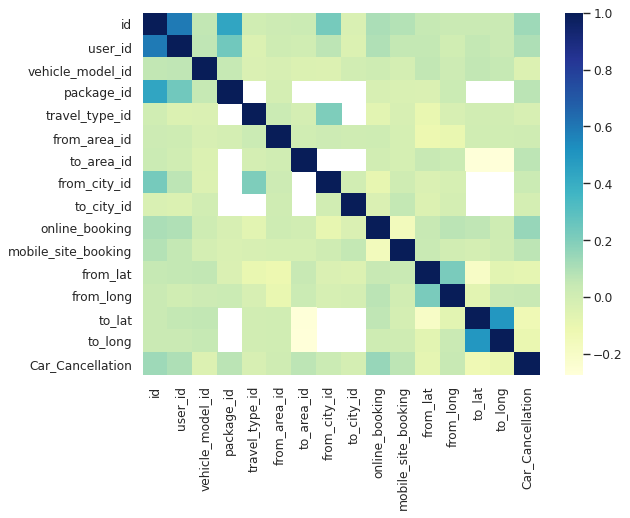

In [28]:
plt.figure(figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
sns.heatmap(df.corr(),cmap="YlGnBu")

### Let's extract day and time from the booking_created column

In [29]:
df.head(3)

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,...,online_booking,mobile_site_booking,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation,booking_created_day,trip_start_day
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,2013-01-01 02:00:00,...,0,0,2013-01-01 01:39:00,12.924150,77.672290,12.927320,77.635750,0,Tuesday,Tuesday
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,2013-01-01 09:00:00,...,0,0,2013-01-01 02:25:00,12.966910,77.749350,12.927680,77.626640,0,Tuesday,Tuesday
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,2013-01-01 03:30:00,...,0,0,2013-01-01 03:08:00,12.937222,77.626915,13.047926,77.597766,0,Tuesday,Tuesday


### Let's now extract the booking created time(hour)

In [30]:
# df['booking_created_day'] = df.booking_created.dt.dayofweek
# df['booking_created_day'] = df.booking_created_day.replace([0, 1, 2, 3, 4, 5, 6], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

df['booking_created_time'] = df.booking_created.dt.hour

In [31]:
df.booking_created_time.unique()

array([ 1,  2,  3,  4,  7,  8,  9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 20,
       21, 22, 23,  0, 16,  5,  6])

In [32]:
df.head()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,...,mobile_site_booking,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation,booking_created_day,trip_start_day,booking_created_time
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,2013-01-01 02:00:00,...,0,2013-01-01 01:39:00,12.924150,77.672290,12.927320,77.635750,0,Tuesday,Tuesday,1
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,2013-01-01 09:00:00,...,0,2013-01-01 02:25:00,12.966910,77.749350,12.927680,77.626640,0,Tuesday,Tuesday,2
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,2013-01-01 03:30:00,...,0,2013-01-01 03:08:00,12.937222,77.626915,13.047926,77.597766,0,Tuesday,Tuesday,3
3,132515,13034,12,NaN,2,768.0,398.0,NaN,NaN,2013-01-01 05:45:00,...,0,2013-01-01 04:39:00,12.989990,77.553320,12.971430,77.639140,0,Tuesday,Tuesday,4
4,132517,22180,12,NaN,2,1365.0,849.0,NaN,NaN,2013-01-01 09:00:00,...,0,2013-01-01 07:53:00,12.845653,77.677925,12.954340,77.600720,0,Tuesday,Tuesday,7


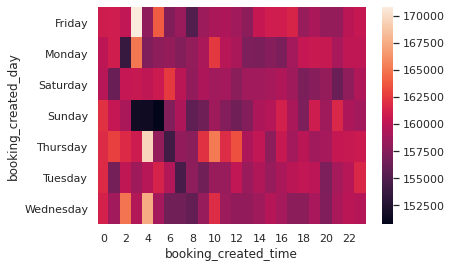

In [33]:
plt.figure(figsize=(6,4))
a = df.pivot_table(index='booking_created_day', 
                   columns='booking_created_time', 
                   values='id'
                   )
sns.heatmap(a)

### Similarly let's extract the month to analyse on which months, the trips were started

In [34]:
df['trip_start_month'] = df.from_date.dt.month

In [35]:
df.trip_start_month.unique()

array([ 1,  2,  3,  5,  4,  6,  7,  8,  9, 10, 11, 12])

In [36]:
df['trip_start_month'] = df.trip_start_month.replace([1, 2, 3, 5, 4, 6, 7, 8, 9, 10, 11, 12], ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])

In [37]:
df.head(3)

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,...,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation,booking_created_day,trip_start_day,booking_created_time,trip_start_month
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,2013-01-01 02:00:00,...,2013-01-01 01:39:00,12.924150,77.672290,12.927320,77.635750,0,Tuesday,Tuesday,1,January
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,2013-01-01 09:00:00,...,2013-01-01 02:25:00,12.966910,77.749350,12.927680,77.626640,0,Tuesday,Tuesday,2,January
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,2013-01-01 03:30:00,...,2013-01-01 03:08:00,12.937222,77.626915,13.047926,77.597766,0,Tuesday,Tuesday,3,January


In [38]:
df['year_of_booking'] = df.booking_created.dt.year

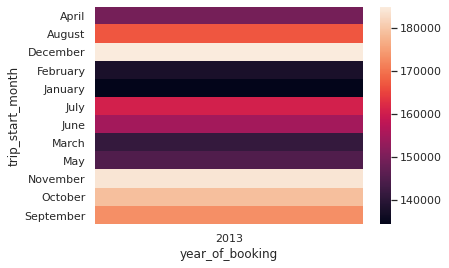

In [39]:
sns.heatmap(df.pivot_table(values='id',index='trip_start_month',columns='year_of_booking'))

### This dataset consists of the users who booked and travelled only in the year 2013.
**We can also notice that most of the bookings were created on the last quater of the year and least least number of bookings were created on the first quater.**

### Let's analyze at what average time (hour) the bookings were created in each day 

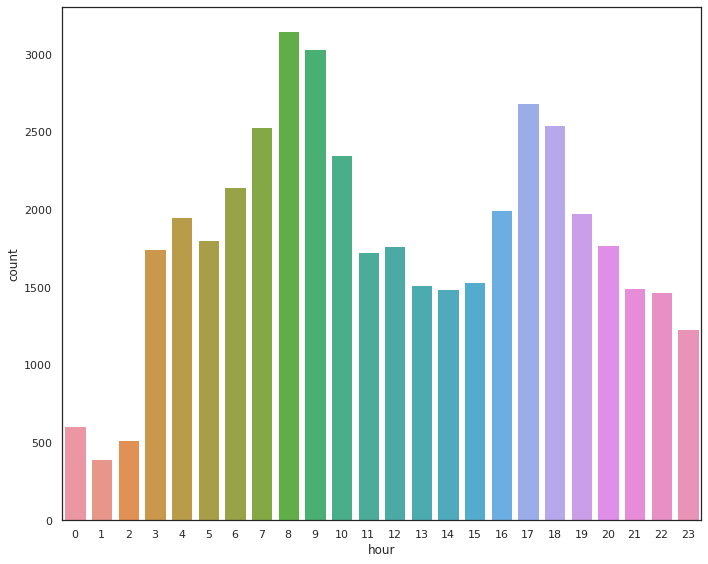

In [40]:
plt.figure(figsize=(10,8))
df['hour'] = df['from_date'].dt.hour
sns.countplot(df['hour'])
plt.tight_layout()

**Most of the bookings were created between 9 AM and 10 AM and between 6 PM and 7 PM assuming that most of the officials commute to and from office at that particular time.**

**You can also notice that the bookings are minimum i.e. between 1 AM and 3 AM in the midnight which makes sense.**

In [41]:
df.head()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,...,from_long,to_lat,to_long,Car_Cancellation,booking_created_day,trip_start_day,booking_created_time,trip_start_month,year_of_booking,hour
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,2013-01-01 02:00:00,...,77.672290,12.927320,77.635750,0,Tuesday,Tuesday,1,January,2013,2
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,2013-01-01 09:00:00,...,77.749350,12.927680,77.626640,0,Tuesday,Tuesday,2,January,2013,9
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,2013-01-01 03:30:00,...,77.626915,13.047926,77.597766,0,Tuesday,Tuesday,3,January,2013,3
3,132515,13034,12,NaN,2,768.0,398.0,NaN,NaN,2013-01-01 05:45:00,...,77.553320,12.971430,77.639140,0,Tuesday,Tuesday,4,January,2013,5
4,132517,22180,12,NaN,2,1365.0,849.0,NaN,NaN,2013-01-01 09:00:00,...,77.677925,12.954340,77.600720,0,Tuesday,Tuesday,7,January,2013,9


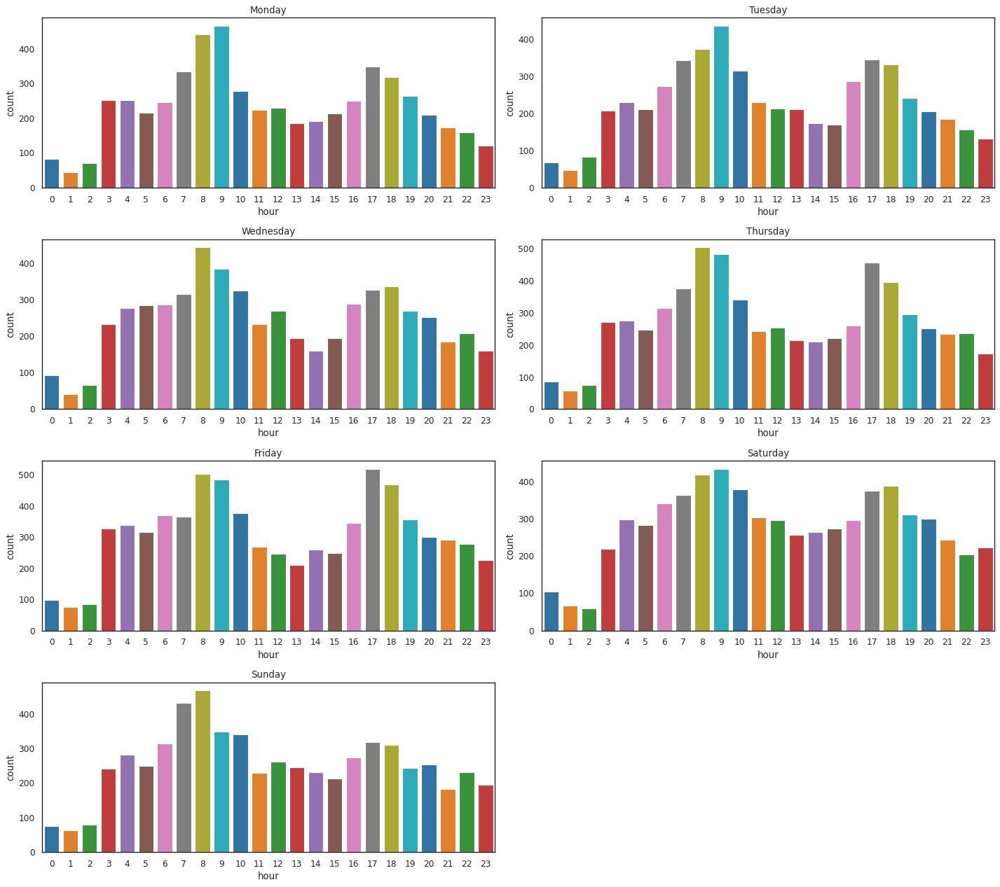

In [42]:
fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')

monday = pd.DataFrame(df[df['booking_created_day']  == "Monday"])
plt.subplot(4, 2, 1)
sns.countplot(monday.hour, palette="tab10")
plt.title("Monday")

tuesday = pd.DataFrame(df[df['booking_created_day']  == "Tuesday"])
plt.subplot(4, 2, 2)
sns.countplot(tuesday.hour, palette="tab10")
plt.title("Tuesday")


wednesday = pd.DataFrame(df[df['booking_created_day']  == "Wednesday"])
plt.subplot(4, 2, 3)
sns.countplot(wednesday.hour, palette="tab10")
plt.title("Wednesday")


thursday = pd.DataFrame(df[df['booking_created_day']  == "Thursday"])
plt.subplot(4, 2, 4)
sns.countplot(thursday.hour, palette="tab10")
plt.title("Thursday")


friday = pd.DataFrame(df[df['booking_created_day']  == "Friday"])
plt.subplot(4, 2, 5)
sns.countplot(friday.hour, palette="tab10")
plt.title("Friday")


saturday = pd.DataFrame(df[df['booking_created_day']  == "Saturday"])
plt.subplot(4, 2, 6)
sns.countplot(saturday.hour, palette="tab10")
plt.title("Saturday")

sunday = pd.DataFrame(df[df['booking_created_day']  == "Sunday"])
plt.subplot(4, 2, 7)
sns.countplot(sunday.hour, palette="tab10")
plt.title("Sunday")

plt.tight_layout()

**The above plot shows that the bookings are comparatively higher at all the time especially during the weekend.**

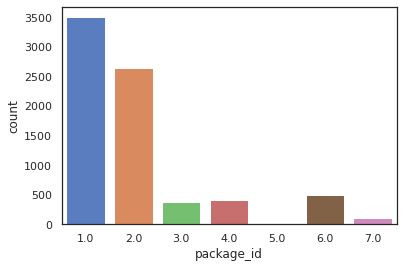

In [43]:
sns.countplot(df.package_id)

**From the above plot it can be seen that most of the users opt for 1 and 2 i.e. 4hrs & 40kms 8hrs & 80 kms package.**

### Calculating the missing values in latitude and longitude columns

In [44]:
df['from_lat'].isnull().sum()

93

In [45]:
df['from_long'].isnull().sum()

93

In [46]:
df['to_lat'].isnull().sum()

9138

In [47]:
df['to_long'].isnull().sum()

9138

**Since only 0.21% of the data is missing in the from_lat and from_long columns, let's drop the rows containing missing valus instead of imputing it.**

In [48]:
df_loc = df.dropna(subset=['from_lat', 'from_long'], axis = 0, inplace=True)

**Removing the missing from_lat and from_long values from all seven days of a week**

In [49]:
mon_loc = monday.dropna(subset=['from_lat', 'from_long'])
tue_loc = tuesday.dropna(subset=['from_lat', 'from_long'])
wed_loc = wednesday.dropna(subset=['from_lat', 'from_long'])
thu_loc = thursday.dropna(subset=['from_lat', 'from_long'])
fri_loc = friday.dropna(subset=['from_lat', 'from_long'])
sat_loc = saturday.dropna(subset=['from_lat', 'from_long'])
sun_loc = sunday.dropna(subset=['from_lat', 'from_long'])

## The below maps visualises the number of pickups for the given latitude and longitude 
### Note:
1. The numbes on the markers represents the number of pickup requests in that geographical area.
2. Orange, yellow and green color of the markers represents more, medium and less number of pickups respectively.

### Geospatial distribution of passenger pickup during mondays

In [50]:
monday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12) # enter the lat long
marker_cluster = MarkerCluster() # define marker cluster
marker_cluster.add_to(monday_map) # add marker cluster to the map

for index, rows in mon_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

monday_map

### Geospatial distribution of passenger pickup during tuesdays

In [51]:
tuesday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(tuesday_map)

for index, rows in tue_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

tuesday_map

### Geospatial distribution of passenger pickup during wednesdays

In [52]:
wednesday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(wednesday_map)

for index, rows in wed_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

wednesday_map

### Geospatial distribution of passenger pickup during thursdays

In [53]:
thursday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(thursday_map)

for index, rows in thu_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

thursday_map

### Geospatial distribution of passenger pickup during fridays

In [54]:
friday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(friday_map)

for index, rows in fri_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

friday_map

### Geospatial distribution of passenger pickup during saturdays

In [55]:
saturday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(saturday_map)

for index, rows in sat_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

saturday_map

### Geospatial distribution of passenger pickup during sundays

In [56]:
sunday_map= folium.Map(location=[12.8452, 77.6602], zoom_start=12)
marker_cluster = MarkerCluster()
marker_cluster.add_to(sunday_map)

for index, rows in sun_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

sunday_map

**From the immediate above three plots we can see that, in the areas like koramangala and madiwala, the number of passenger pickups are high during weekends compared to other weekdays.**

## Conclusion:
1. Despite of cancelling rides, most of the people take a cab during weekends to travel from one location to another
2. The demand of the cab is high during the office commuting hours i.e. between 9 AM - 10 AM and 6 PM - 7 PM, and least during the midnight (1 AM to 3 AM)
3. Frequency of point to point travel is high, and the least is long distance.

Therefore, the utilization rate of the cabs can be maximised by:
1. Increasing the fare during office commute period, and during the weekends.
2. Getting more cabs to do point to point and less on long distance and rental type of travel.